# Custom vision

Dataset and video files used in this exercise has been downloaded from this source: 
    https://www.kaggle.com/datasets/robikscube/driving-video-with-object-tracking/com

# Azure Custom Vision
Azure AI Custom Vision stores training images and labels for the purpose of training with Transfer Learning, and to generate the custom model for your use case. Custom Vision Service models are hosted in Azure AI Custom Vision service.

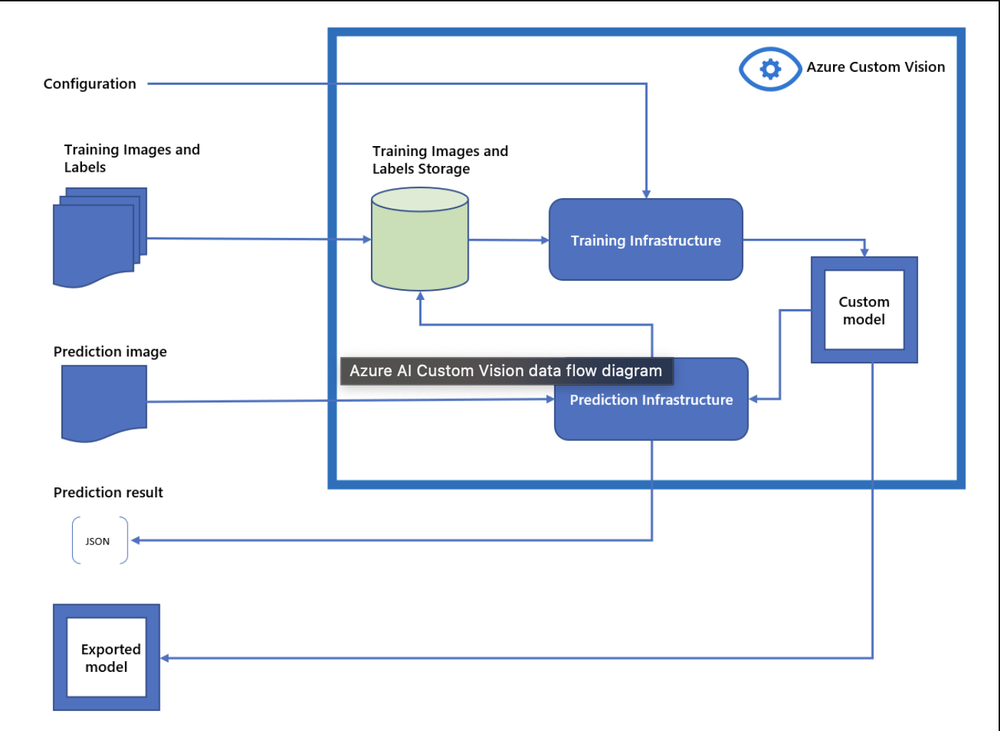

In [196]:
img('11.png')

## Prerequisites
## Importing necessary libraries

In [199]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from glob import glob

import IPython.display as ipd
from tqdm import tqdm

import subprocess

plt.style.use('ggplot')


# to connect to the training resource
from azure.cognitiveservices.vision.customvision.training import CustomVisionTrainingClient

# to connect to the prediction resource
from azure.cognitiveservices.vision.customvision.prediction import CustomVisionPredictionClient

# to send the input files in batch; and to identify the object regions; for the training of the model.
from azure.cognitiveservices.vision.customvision.training.models import ImageFileCreateBatch, ImageFileCreateEntry, Region

# To authenticate the client
from msrest.authentication import ApiKeyCredentials
import os, uuid

# To read the local environment variables and secret keys
import os, dotenv
from dotenv import load_dotenv, find_dotenv

# To read the dataset
import pandas as pd

# to view images
from IPython.display import Image as img

# to process data in batches
import itertools

# to draw bounding boxes in local output.
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import numpy as np

import subprocess

## Create an resource group on the Azure Portal.

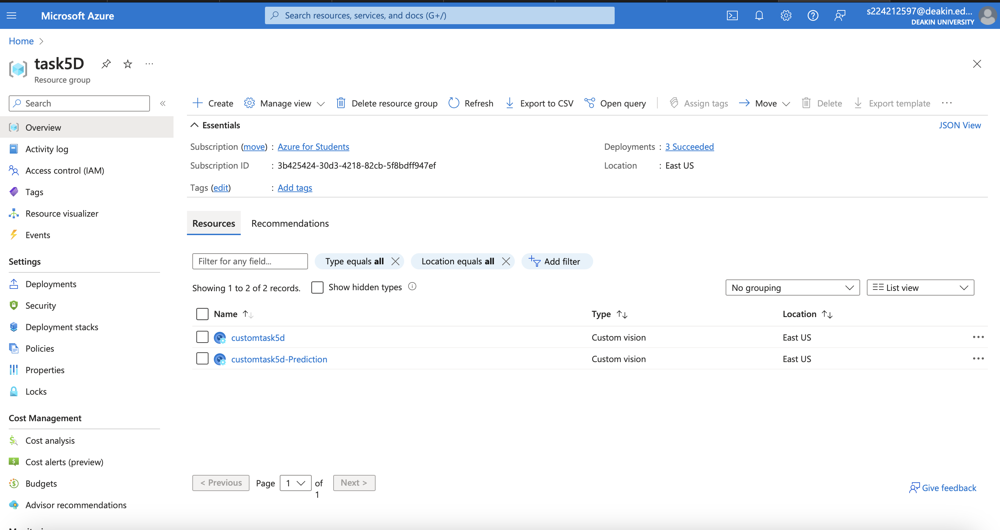

In [191]:
img('1.png')

## In resource group , search and select custom vision in marketplace 

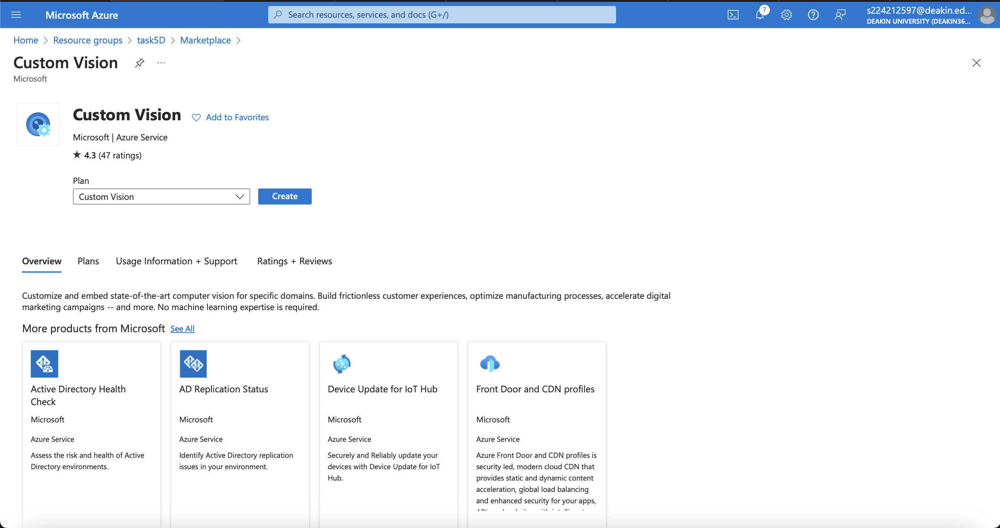

In [197]:
img('12.png')

## Select both Training and Prediction resources to be created.

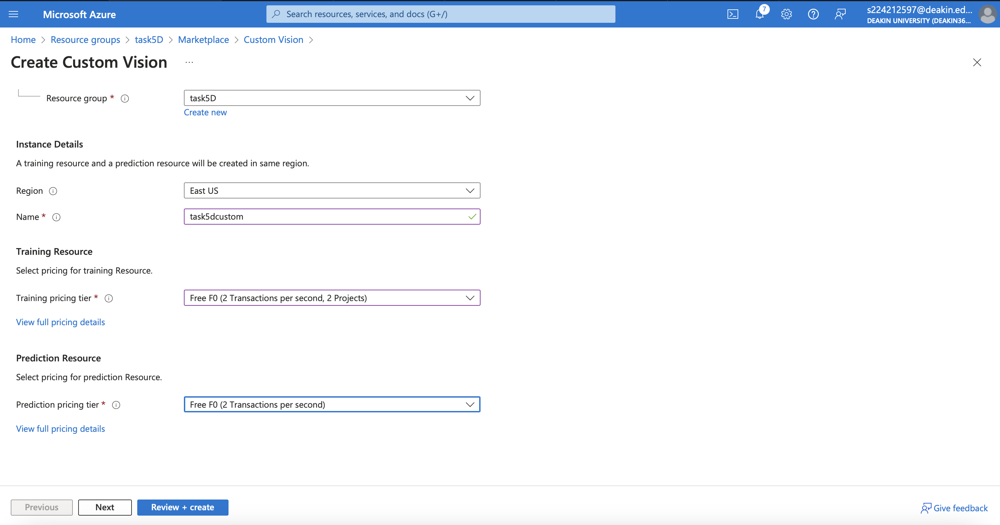

In [198]:
img('13.png')

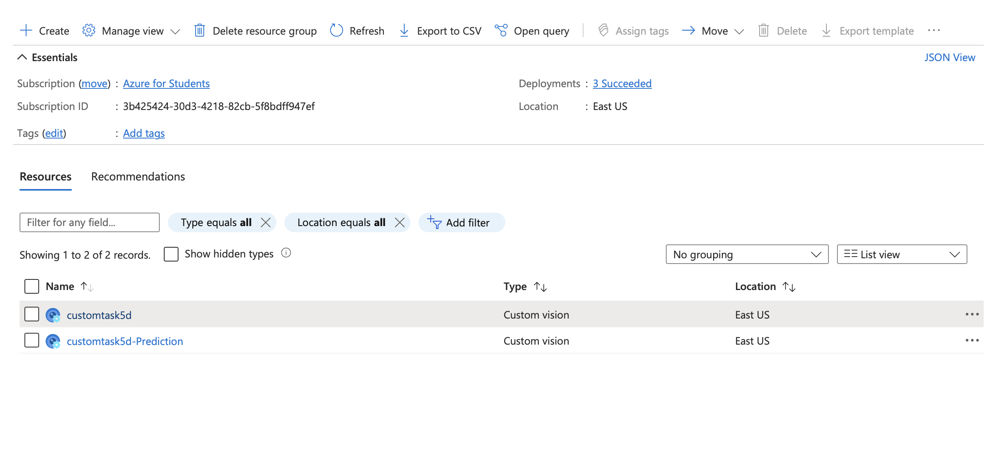

In [192]:
img('2.png')

# Getting the Key, Endpoint and Resource id information:
Go to https://www.customvision.ai/projects#/settings

Expand the training resource section.

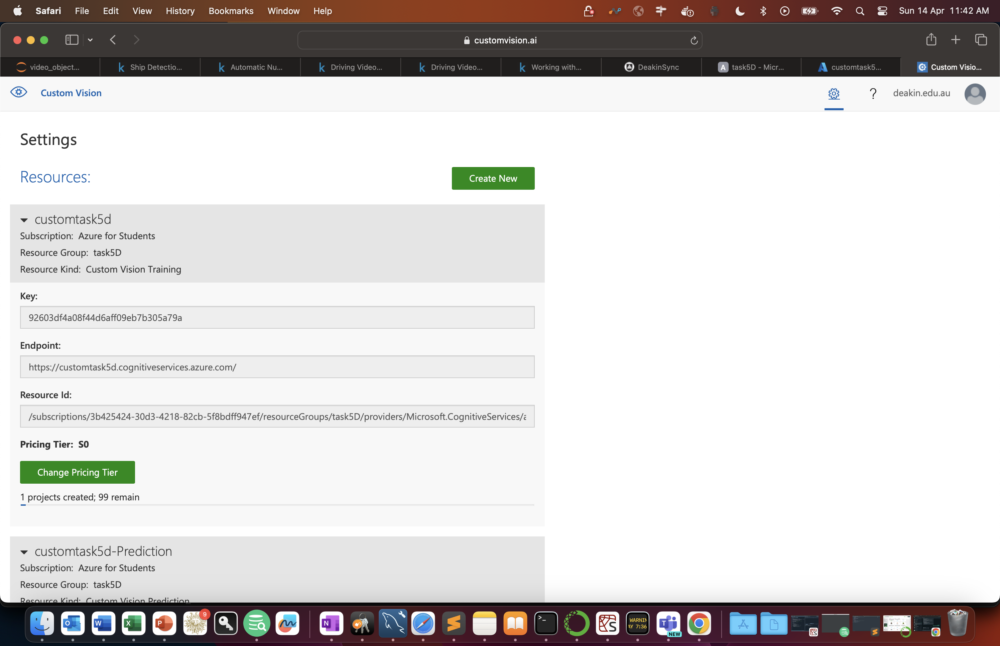

In [193]:
img('3.png')

# Connectiong to Asure Custom Vision Services 

In [1]:
### We will replace the variables values with values from above custom vision training and prediction resources.

VISION_TRAINING_ENDPOINT = ''
training_key = ''
VISION_PREDICTION_ENDPOINT= ''
prediction_key = ''
prediction_resource_id = ''

# Converting video types
Use ffmpeg to convert mov to mp4. 

Read more in the documentation here: https://ffmpeg.org/ffmpeg.html

In [204]:
input_file = '/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/archive/bdd100k_videos_train_00/bdd100k/videos/train/018f1d4d-0937fae5.mov'
subprocess.run(['ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                '018f1d4d-0937fae5.mp4',
                '-loglevel',
                'quiet']
              )

CompletedProcess(args=['ffmpeg', '-i', '/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/archive/bdd100k_videos_train_00/bdd100k/videos/train/018f1d4d-0937fae5.mov', '-qscale', '0', '018f1d4d-0937fae5.mp4', '-loglevel', 'quiet'], returncode=0)

In [205]:
!ls -GFlash --color

total 330672
     0 drwxr-xr-x    26 prakumar80  staff   832B Apr 15 20:02 ./
     0 drwxr-xr-x     9 prakumar80  staff   288B Apr 13 18:03 ../
    40 -rw-r--r--@    1 prakumar80  staff    16K Apr 15 20:01 .DS_Store
     0 drwxr-xr-x@    6 prakumar80  staff   192B Apr 14 01:48 .ipynb_checkpoints/
 34824 -rw-r--r--     1 prakumar80  staff    17M Apr 15 20:02 018f1d4d-0937fae5.mp4
 33480 -rw-r--r--     1 prakumar80  staff    16M Apr 14 10:22 01c5cd64-278f8b91.mp4
   840 -rw-r--r--@    1 prakumar80  staff   417K Apr 14 07:11 1.png
   896 -rw-r--r--@    1 prakumar80  staff   446K Apr 14 21:06 10.png
   312 -rw-r--r--@    1 prakumar80  staff   154K Apr 15 19:44 11.png
   768 -rw-r--r--@    1 prakumar80  staff   383K Apr 15 19:52 12.png
   584 -rw-r--r--@    1 prakumar80  staff   290K Apr 15 19:53 13.png
   448 -rw-r--r--@    1 prakumar80  staff   221K Apr 14 07:17 2.png
  1800 -rw-r--r--@    1 prakumar80  staff   899K Apr 14 11:42 3.png
   328 -rw-r--r--@    1 prakumar80  staff   164K Apr 1

# Display Video in Notebook

In [206]:
ipd.Video('018f1d4d-0937fae5.mp4', width=700)

# Pulling in Images from Video

# Converting and Saving the frames

In [134]:
# Specify the video path
video_path = "01c5cd64-278f8b91.mp4"

# Define output folder for frames (create it if it doesn't exist)
output_folder = "/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/images/"
os.makedirs(output_folder, exist_ok=True)  # Create folder if it doesn't exist

# Open the video capture object
cap = cv2.VideoCapture(video_path)

# Check if video opened successfully
if not cap.isOpened():
    print("Error opening video!")
    exit()

# Get frame count (optional, for progress tracking)
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# Process each frame and save as image
frame_number = 0
while True:
    # Capture frame-by-frame
    ret, frame = cap.read()

    # Check if frame is read correctly
    if not ret:
        print("No more frames to read!")
        break

    # Generate filename with frame number (modify format if needed)
    filename = f"{output_folder}/frame_{frame_number:05d}.jpg"  # 05d for 5 digit padding

    # Save the frame as an image
    cv2.imwrite(filename, frame)

    # Optional: Print progress (modify as needed)
    if frame_number % 100 == 0:
        print(f"Extracted {frame_number} frames out of {frame_count}")

    # Increment frame counter
    frame_number += 1

# Release the video capture object
cap.release()

print("Video stripped to frames successfully!")

Extracted 0 frames out of 1205
Extracted 100 frames out of 1205
Extracted 200 frames out of 1205
Extracted 300 frames out of 1205
Extracted 400 frames out of 1205
Extracted 500 frames out of 1205
Extracted 600 frames out of 1205
Extracted 700 frames out of 1205
Extracted 800 frames out of 1205
Extracted 900 frames out of 1205
Extracted 1000 frames out of 1205
Extracted 1100 frames out of 1205
Extracted 1200 frames out of 1205
No more frames to read!
Video stripped to frames successfully!


## Step to create a project in Custom Vision Plateform (https://www.customvision.ai)
Customvision.ai is a website and platform provided by Microsoft Azure as part of its Custom Vision service. It allows users to create and manage custom image classification and object detection models

In [29]:
# create variables for your training resource
credentials = ApiKeyCredentials(in_headers={"Training-key": training_key})
trainer = CustomVisionTrainingClient(VISION_TRAINING_ENDPOINT, credentials)

# create variables for your prediction resource
prediction_credentials = ApiKeyCredentials(in_headers={"Prediction-Key": prediction_key})
predictor = CustomVisionPredictionClient(VISION_PREDICTION_ENDPOINT, prediction_credentials)

publish_iteration_name = "video-object-detect"

# Find the object detection domain
obj_detection_domain = next(domain for domain in trainer.get_domains() if
                           domain.type == "ObjectDetection" and domain.name == "General")

# Create a new project
print("Creating project...")
# Use uuid to avoid project name collisions.
project = trainer.create_project(publish_iteration_name,
                                domain_id=obj_detection_domain.id)

# Make two tags in the new project
car_tag = trainer.create_tag(project.id, "car")

Creating project...


In [31]:
predictor

## To view the project in https://www.customvision.ai/projects
A Custom Vision project in customvision.ai refers to a specific instance where we can create and train a custom image classification or object detection model. 
Within a project, we can upload images, label them, and train the model to recognize these images based on the provided labels.

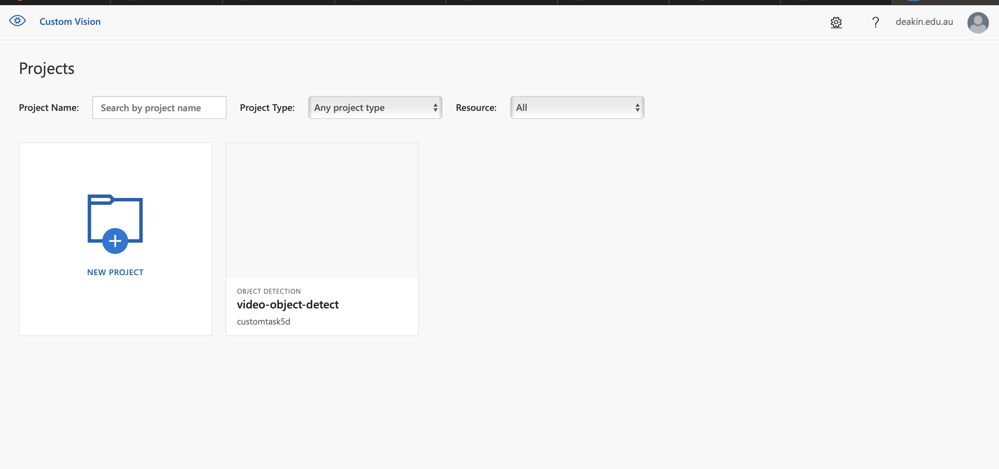

In [207]:
img('14.png')

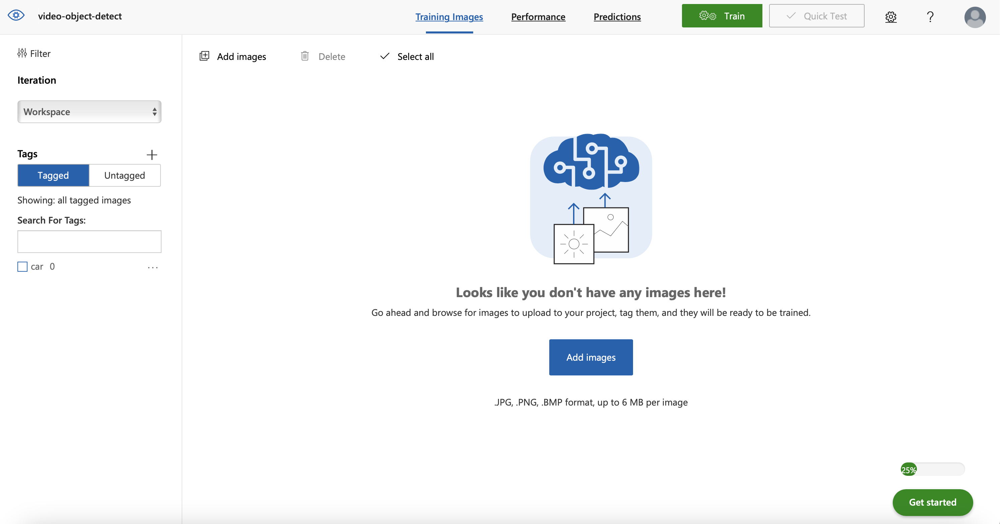

In [208]:
img('15.png')

# Upload images to the project:

In [98]:
# Specify the base directory where your image files are located
base_image_location = "/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/images/"

# Check if the base directory exists
if not os.path.exists(base_image_location):
    raise FileNotFoundError(f"The directory '{base_image_location}' does not exist.")

# Specifying the batch size for processing images
batch_size = 20

# Iterate through the image files in batches
for start in range(0, len(os.listdir(base_image_location)), batch_size):
    stop = min(start + batch_size, len(os.listdir(base_image_location)))
    image_files_batch = os.listdir(base_image_location)[start:stop]

    # Create a list to store ImageFileCreateEntry objects for batch upload
    images_to_upload = []

    # Iterate through the image files in the batch
    for file_name in image_files_batch:
        # Construct the full path to the image file
        image_path = os.path.join(base_image_location, file_name)

        # Check if the image file exists
        if not os.path.exists(image_path):
            raise FileNotFoundError(f"The image file '{image_path}' does not exist.")

        # Open the image file and read its contents
        with open(image_path, mode="rb") as image_contents:
            # Create an ImageFileCreateEntry object and add it to the list
            images_to_upload.append(ImageFileCreateEntry(name=file_name, contents=image_contents.read()))

    # Create a batch object for uploading images
    image_batch = ImageFileCreateBatch(images=images_to_upload)

    # Upload the batch of images
    upload_result = trainer.create_images_from_files(project.id, image_batch)

    # Check if the batch upload was successful
    if not upload_result.is_batch_successful:
        print("Image batch upload failed.")
        for image in upload_result.images:
            print("Image status: ", image.status)
        exit(-1)

    print("Image batch uploaded successfully.")

Image batch upload failed.
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  OK
Image status:  ErrorImageFormat
Image batch uploaded successfully.


IsADirectoryError: [Errno 21] Is a directory: '/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/images/.ipynb_checkpoints'

## Verify in project after above code completes and check if images uploaded successfully

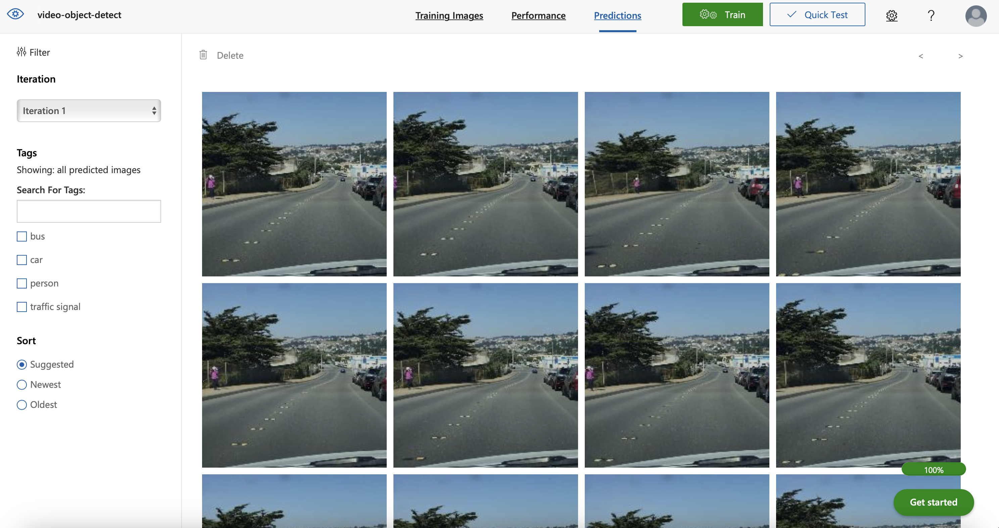

In [209]:
img('16.png')

## Next step is to tag the objects in images

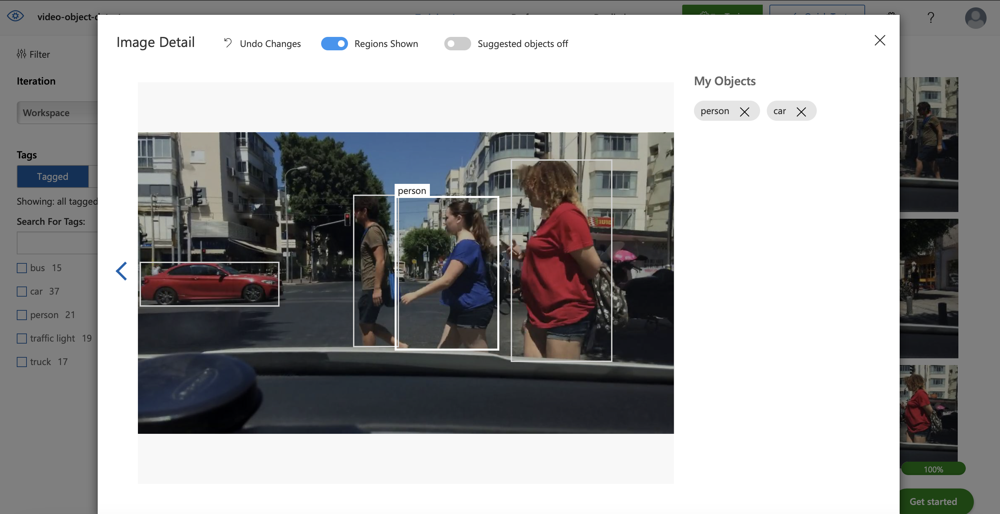

In [210]:
img('17.png')

## Training the model
The detector uses all of the current images and their tags to create a model that identifies each tagged object. 

In [135]:
import time

print ("Training...")
iteration = trainer.train_project(project.id)
while (iteration.status != "Completed"):
    iteration = trainer.get_iteration(project.id, iteration.id)
    print ("Training status: " + iteration.status)
    time.sleep(1)

Training...
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training


# Understanding the performance metrics:
After training has completed, the model's performance is calculated and displayed. The Custom Vision service uses the images that you submitted for training to calculate precision, recall, and mean average precision. 
## 1. Precision
## 2. Recall
## 3. Mean Average Precision (mAP)

![Mean Average Precision](https://a.storyblok.com/f/139616/1200x800/e3195e34f1/map-elements.webp)
https://a.storyblok.com/f/139616/1200x800/e3195e34f1/map-elements.webp

## Intersection over Union

**Intersection over Union (IoU)** is used to measure the accuracy of the localization provided by an object detector on a particular dataset. It does this by using the ground truth box and measures how much the predicted bounding box coordinates overlap the ground truth box coordinates.

![IoU](https://www.kdnuggets.com/wp-content/uploads/wadawadagi-object-detector-metrics-1.jpg)

https://www.kdnuggets.com/wp-content/uploads/wadawadagi-object-detector-metrics-1.jpg

For object detection tasks, we calculate precision and recall using the IoU value for a given IoU threshold.

For example, if the IoU threshold is 0.5, and the IoU value for a prediction is 0.7, then we classify the prediction as true positive (TP). On the other hand, if the IoU is 0.3, we classify it as False Positive (FP).

After training has completed, the model's performance is calculated and displayed. The Custom Vision service uses the images that you submitted for training to calculate precision, recall, and mean average precision. Precision and recall are two different measurements of the effectiveness of a detector:

## Precision

### Precision = true positives / (true positives + false positives)

**Precision** measures how accurate your predictions are. i.e. the percentage of your predictions that are correct. For example, if the model identified 100 images as cars, and 99 of them were actually of car, then the precision would be 99%.

## Recall

### Recall = true positives / (true positives + false negatives)

**Recall** measures how well you find all the positives.For example, if there were actually 100 images of cars, and the model identified 80 as cars, the recall would be 80%.

TP = true positives (predicted as positive and found to be correct)<br>
FN = false negatives (failed to predict an object that was there)

![Metrics for object detection.](https://labelyourdata.com/img/article-illustrations/key_object_detection.jpg)  <https://labelyourdata.com/img/article-illustrations/key_object_detection.jpg/>


## Mean Average Precision (mAP)

**Mean average precision**  is the average value of the average precision (AP). The AP is the area under the precision/recall curve (precision plotted against recall for each prediction made).The higher the mAP score, the more accurate the model detects and makes correct predictions.

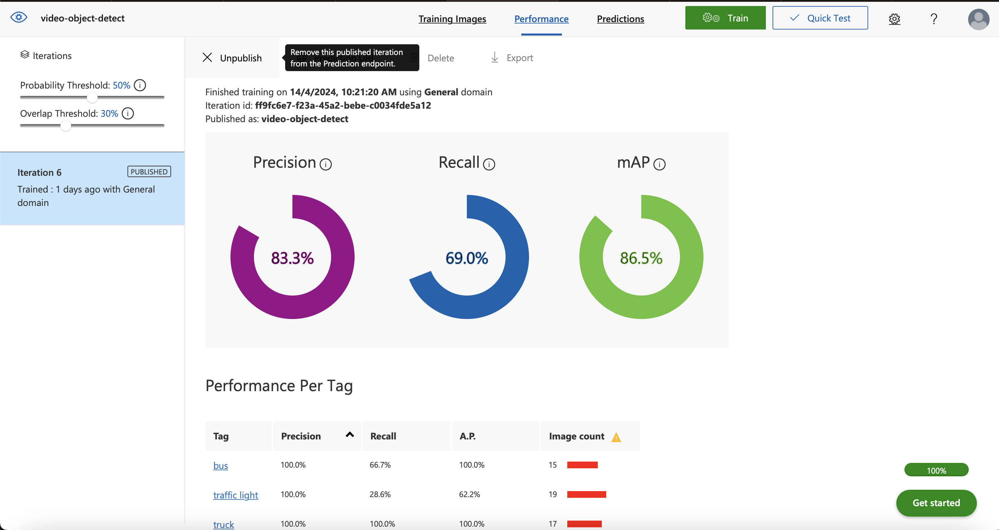

In [213]:
img('18.png')

## Importing the video that is to be predicted and stripping it to frames (where the object detection is to be done)

In [136]:
input_file = '/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/archive/bdd100k_videos_train_00/bdd100k/videos/train/01c5cd64-278f8b91.mov'

subprocess.run(['/Users/prakumar80/opt/anaconda3/bin/ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                '01c5cd64-278f8b91.mp4',
                '-loglevel',
                'quiet']
              )

CompletedProcess(args=['/Users/prakumar80/opt/anaconda3/bin/ffmpeg', '-i', '/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/archive/bdd100k_videos_train_00/bdd100k/videos/train/01c5cd64-278f8b91.mov', '-qscale', '0', '01c5cd64-278f8b91.mp4', '-loglevel', 'quiet'], returncode=0)

# Stripping the video to frames and saving it

In [137]:
# Specify the video path
video_path = "/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/archive/bdd100k_videos_train_00/bdd100k/videos/train/01c5cd64-278f8b91.mov"

# Define output folder for frames (create it if it doesn't exist)
output_folder = "/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/test"
os.makedirs(output_folder, exist_ok=True)  # Create folder if it doesn't exist

# Open the video capture object
cap = cv2.VideoCapture(video_path)

# Check if video opened successfully
if not cap.isOpened():
    print("Error opening video!")
    exit()

# Get frame count (optional, for progress tracking)
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# Process each frame and save as image
frame_number = 0
while True:
    # Capture frame-by-frame
    ret, frame = cap.read()

    # Check if frame is read correctly
    if not ret:
        print("No more frames to read!")
        break

    # Generate filename with frame number (modify format if needed)
    filename = f"{output_folder}/frame_{frame_number:05d}.jpg"  # 05d for 5 digit padding

    # Save the frame as an image
    cv2.imwrite(filename, frame)

    # Optional: Print progress (modify as needed)
    if frame_number % 100 == 0:
        print(f"Extracted {frame_number} frames out of {frame_count}")

    # Increment frame counter
    frame_number += 1

# Release the video capture object
cap.release()

print("Video stripped to frames successfully!")

Extracted 0 frames out of 1205
Extracted 100 frames out of 1205
Extracted 200 frames out of 1205
Extracted 300 frames out of 1205
Extracted 400 frames out of 1205
Extracted 500 frames out of 1205
Extracted 600 frames out of 1205
Extracted 700 frames out of 1205
Extracted 800 frames out of 1205
Extracted 900 frames out of 1205
Extracted 1000 frames out of 1205
Extracted 1100 frames out of 1205
Extracted 1200 frames out of 1205
No more frames to read!
Video stripped to frames successfully!


In [138]:
# saving the best iteration
iteration.id = 'ff9fc6e7-f23a-45a2-bebe-c0034fde5a12'

In [139]:
# The iteration is now trained. Publish it to the project endpoint
trainer.publish_iteration(project.id, iteration.id, publish_iteration_name, prediction_resource_id)
print ("Done!")

Done!


# Test the model. Make a prediction by sending a test image.

In [140]:
# Now there is a trained endpoint that can be used to make a prediction
# Open the sample image and get back the prediction results.
with open('/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/test/frame_00502.jpg',
            mode="rb") as test_data:
  results = predictor.detect_image(project.id, publish_iteration_name,
                                    test_data)

# Display the results.
for prediction in results.predictions:
  print("\t" + prediction.tag_name + ": {0:.2f}% bbox.left = {1:.2f}, bbox.top = {2:.2f}, bbox.width = {3:.2f}, bbox.height = {4:.2f}".format(
          prediction.probability * 100, prediction.bounding_box.left,
          prediction.bounding_box.top, prediction.bounding_box.width,
          prediction.bounding_box.height))

	car: 67.85% bbox.left = 0.00, bbox.top = 0.44, bbox.width = 0.13, bbox.height = 0.18
	car: 47.98% bbox.left = 0.37, bbox.top = 0.47, bbox.width = 0.07, bbox.height = 0.10
	car: 39.42% bbox.left = 0.96, bbox.top = 0.46, bbox.width = 0.03, bbox.height = 0.13
	car: 24.73% bbox.left = 0.26, bbox.top = 0.47, bbox.width = 0.07, bbox.height = 0.08
	person: 21.19% bbox.left = 0.69, bbox.top = 0.45, bbox.width = 0.03, bbox.height = 0.15
	car: 18.91% bbox.left = 0.91, bbox.top = 0.42, bbox.width = 0.06, bbox.height = 0.13
	car: 14.09% bbox.left = 0.18, bbox.top = 0.49, bbox.width = 0.04, bbox.height = 0.06
	car: 8.02% bbox.left = 0.32, bbox.top = 0.47, bbox.width = 0.06, bbox.height = 0.08
	car: 7.25% bbox.left = 0.95, bbox.top = 0.41, bbox.width = 0.04, bbox.height = 0.13
	car: 3.82% bbox.left = 0.27, bbox.top = 0.42, bbox.width = 0.05, bbox.height = 0.08
	car: 3.72% bbox.left = 0.14, bbox.top = 0.49, bbox.width = 0.03, bbox.height = 0.06
	car: 2.12% bbox.left = 0.18, bbox.top = 0.42, bbox.wid

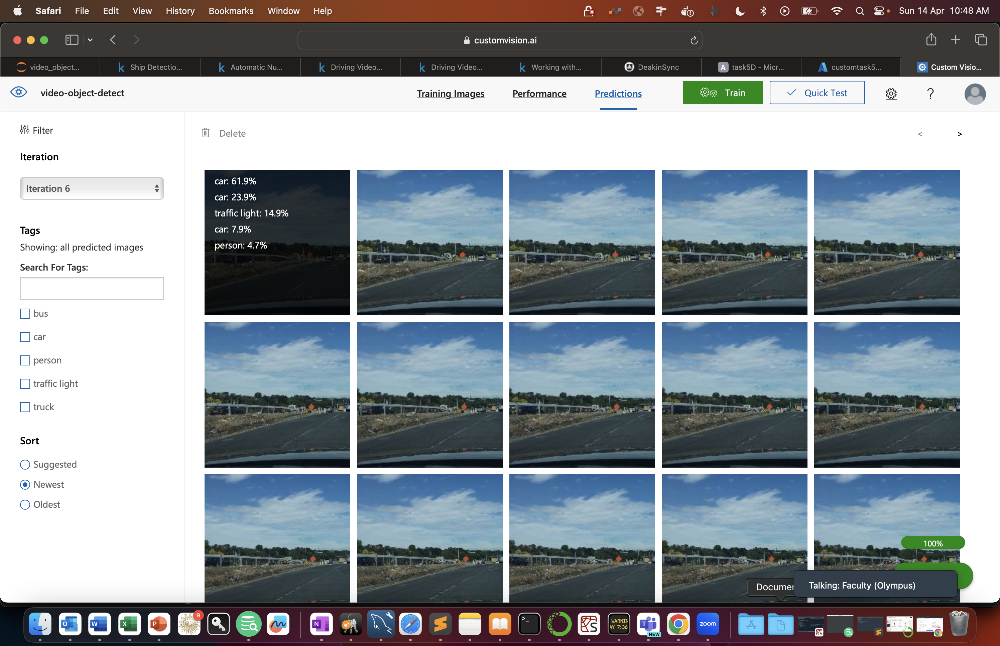

In [215]:
img('19.png')

# Making predictions for all the frames from the video

In [143]:
# List to store prediction results for all images
all_results = []

# Iterate over the range of file names
for i in range(502,1200):  # Assuming 1200 is inclusive
    # Construct the file name
    file_name = f"frame_{i:05d}.jpg"  # Format the number with leading zeros

    # Construct the full path to the image file
    image_path = os.path.join('/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/test', file_name)

    # Check if the file exists
    if os.path.exists(image_path):
        # Open the image file and get prediction results
        with open(image_path, mode="rb") as test_data:
            # Predict the current image
            result = predictor.detect_image(project.id, publish_iteration_name, test_data)
        
        # Store the prediction result along with the image file name
        all_results.append({"image_file": file_name, "result": result})
    else:
        print(f"File '{file_name}' not found.")

    # Optionally, you can add a delay between predictions to avoid overloading the service
    time.sleep(1)  # Adjust the delay as needed

## Viewing the bounding box in the image.
### Of all the predictions made, we will only show the bounding box for which the confidence exceeds a certain threshold, say 50%.

In [181]:
# Load a test image and get its dimensions
img_file = '/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/test/frame_00502.jpg'
my_img = Image.open(img_file)
img_height, img_width, img_ch = np.array(my_img).shape

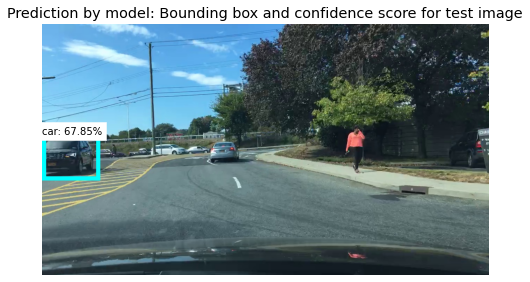

In [183]:
# Create a figure to display the results
fig = plt.figure(figsize=(8, 8))
plt.axis('off')
# Display the image
draw = ImageDraw.Draw(my_img)
print(draw)
# Select line width and color for the bounding box
lineWidth = int(img_width/100)
prediction_color = 'cyan'
# Display the results
for prediction in results.predictions:
    color = 'white' # default
    if (prediction.probability*100) > 50:
        left = prediction.bounding_box.left * img_width
        top = prediction.bounding_box.top * img_height
        height = prediction.bounding_box.height * img_height
        width =  prediction.bounding_box.width * img_width
        # Create a rectangle
        draw.rectangle((left, top, left+width, top+height), outline=prediction_color, width=lineWidth)
        # Display tags and probabilities
        plt.annotate(f"{prediction.tag_name}: {prediction.probability * 100 :.2f}%",(left,top), backgroundcolor=color)
plt.imshow(my_img)
plt.title("Prediction by model: Bounding box and confidence score for test image")
plt.show()

# Getting the predicted images from Azure and saving it into our local system

In [185]:
import os
import time  # Import the time module for adding delay
from azure.cognitiveservices.vision.customvision.prediction import models

# List to store prediction results for all images
all_results = []

# Iterate over the range of file names
for i in range(502,1200):  # Assuming 1200 is inclusive
    # Construct the file name
    file_name = f"frame_{i:05d}.jpg"  # Format the number with leading zeros

    # Construct the full path to the image file
    image_path = os.path.join('/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/test/', file_name)

    # Check if the file exists
    if os.path.exists(image_path):
        # Open the image file and get prediction results
        with open(image_path, mode="rb") as test_data:
            # Predict the current image
            result = predictor.detect_image(project.id, publish_iteration_name, test_data)
        
        # Store the prediction result along with the image file name
        all_results.append({"image_file": file_name, "result": result})

        # Visualize bounding boxes on the image and save it
        img = Image.open(image_path)
        draw = ImageDraw.Draw(img)
        for prediction in result.predictions:
            if prediction.probability * 100 > 15:
                left = prediction.bounding_box.left * img.width
                top = prediction.bounding_box.top * img.height
                width = prediction.bounding_box.width * img.width
                height = prediction.bounding_box.height * img.height
                draw.rectangle([left, top, left + width, top + height], outline='cyan', width=3)
                draw.text((left, top), f"{prediction.tag_name}: {prediction.probability * 100:.2f}%", fill="white")
        img.save(f"/Users/prakumar80/Library/CloudStorage/OneDrive-PublicisGroupe/MS_Deakin_University/EngineeringAISolutions/Week5/predictions/{file_name}")  # Replace '/path/to/output_folder/' with your output folder path

    else:
        print(f"File '{file_name}' not found.")

    # Optionally, you can add a delay between predictions to avoid overloading the service
    time.sleep(1)  # Adjust the delay as needed


# Converting the individual frames to video

In [186]:
# Specify the folder containing the image frames
image_folder = "predictions"

# Specify the output video filename and codec (modify codec if needed)
output_video_path = "predicted_video.mp4"
video_codec = "mp4v"  # You can modify this for other codecs (e.g., "XVID")

# Get all image files from the folder (handle non-numeric filenames)
images = []
for filename in os.listdir(image_folder):
    if filename.endswith((".jpg", ".jpeg", ".png")):
        images.append(filename)

images.sort()  # Sorts filenames alphabetically (or modify logic)

# Read the first image to get frame dimensions (assuming all images have same size)
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, _ = frame.shape

# Create video writer with desired codec, frame rate (adjust if needed), and resolution
fps = 30  # Adjust frame rate as needed
out = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*video_codec), fps, (width, height))

# Process and write each image to the output video
for image in images:
    img_path = os.path.join(image_folder, image)
    frame = cv2.imread(img_path)

    # Process the frame using your function (optional)
    # Here's an example of grayscale conversion (replace with your processing logic)
    # frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Write the processed frame to the output video
    out.write(frame)

# Release resources
out.release()

print("Video created from frames!")

Video created from frames!


In [187]:
ipd.Video('predicted_video.mp4', width=700)